In [1]:
# X-DRXAI: Explainable Dimensionality-Reduction-Driven Unsupervised Learning Model

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split

import umap
import shap
from lime import lime_tabular

# Step 1: Load and Preprocess Data
def preprocess_data(df, verbose=True):
    # Drop rows with missing values
    df_clean = df.dropna()

    # Convert categorical variables to one-hot encoded columns
    df_encoded = pd.get_dummies(df_clean)

    # Standardize features
    scaler = StandardScaler()
    scaled_array = scaler.fit_transform(df_encoded)
    scaled_df = pd.DataFrame(scaled_array, columns=df_encoded.columns)

    if verbose:
        print(f"Preprocessing complete. Data shape after encoding and scaling: {scaled_df.shape}")

    return scaled_df

file_path = "New_Datasets/tissue_gene_expression.csv"
df = pd.read_csv(file_path, low_memory=False)
print("Data loaded.")

processed_data = preprocess_data(df)

Data loaded.
Preprocessing complete. Data shape after encoding and scaling: (189, 696)


C:\Users\kashi\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


PCA reduced to 10 components. UMAP reduced to 2D.


C:\Users\kashi\AppData\Local\Temp\ipykernel_35120\1258818273.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=components, y=explained_var, palette="Blues_d")
C:\Users\kashi\AppData\Local\Temp\ipykernel_35120\1258818273.py:31: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  plt.tight_layout()
C:\Users\kashi\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


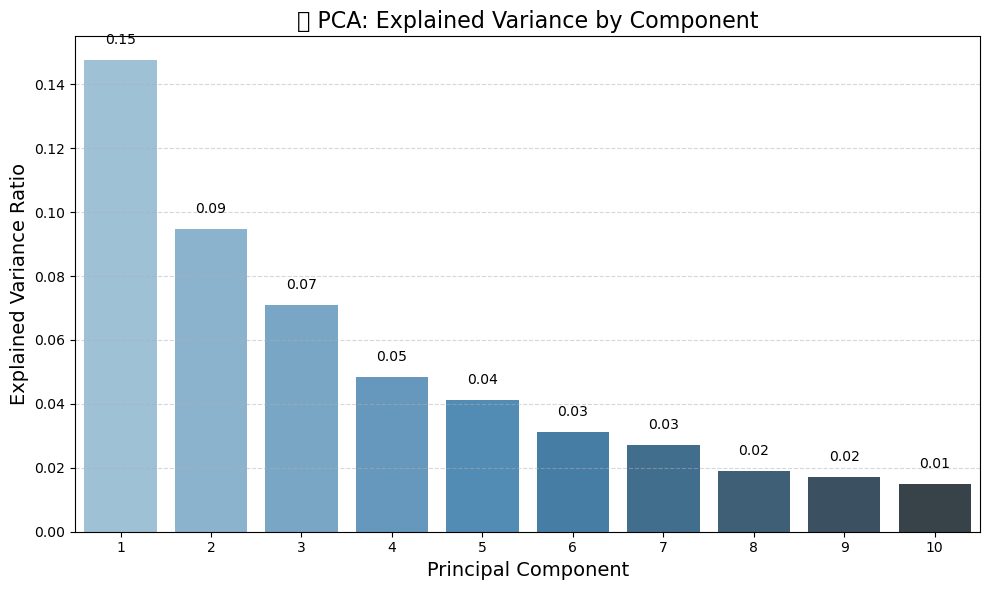

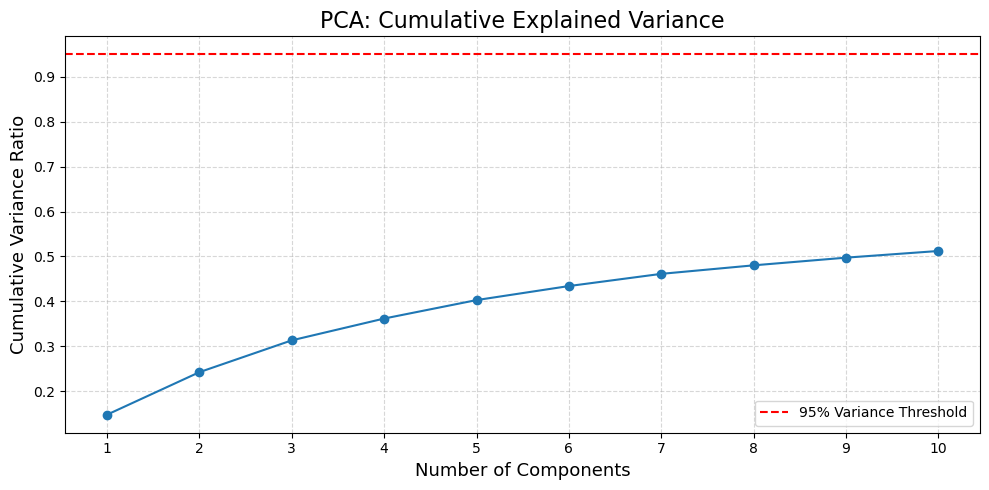

In [2]:
# Step 2: Dimensionality Reduction (PCA + UMAP)
def apply_dimensionality_reduction(data, pca_components=10, umap_components=2, return_pca=False, verbose=True):
    # Apply PCA
    pca = PCA(n_components=pca_components, random_state=42)
    pca_data = pca.fit_transform(data)

    # Apply UMAP on top of PCA output
    reducer = umap.UMAP(n_components=umap_components, random_state=42)
    umap_data = reducer.fit_transform(pca_data)

    if verbose:
        print(f"PCA reduced to {pca_components} components. UMAP reduced to {umap_components}D.")

    if return_pca:
        return umap_data, pca
    else:
        return umap_data

def plot_pca_explained_variance(pca):
    explained_var = pca.explained_variance_ratio_
    components = np.arange(1, len(explained_var) + 1)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=components, y=explained_var, palette="Blues_d")
    plt.title("🔍 PCA: Explained Variance by Component", fontsize=16)
    plt.xlabel("Principal Component", fontsize=14)
    plt.ylabel("Explained Variance Ratio", fontsize=14)
    for i, v in enumerate(explained_var):
        plt.text(i, v + 0.005, f"{v:.2f}", ha='center', fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

def plot_pca_cumulative_variance(pca_model):
    cumulative_var = np.cumsum(pca_model.explained_variance_ratio_)
    n_components = len(cumulative_var)

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, n_components + 1), cumulative_var, marker='o', linestyle='-')
    plt.axhline(y=0.95, color='red', linestyle='--', label='95% Variance Threshold')
    plt.title("PCA: Cumulative Explained Variance", fontsize=16)
    plt.xlabel("Number of Components", fontsize=13)
    plt.ylabel("Cumulative Variance Ratio", fontsize=13)
    plt.xticks(range(1, n_components + 1))
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()

dr_data, pca_model = apply_dimensionality_reduction(processed_data, return_pca=True)
plot_pca_explained_variance(pca_model)
plot_pca_cumulative_variance(pca_model)

C:\Users\kashi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


K-Means clustering done. Silhouette Score: 0.742


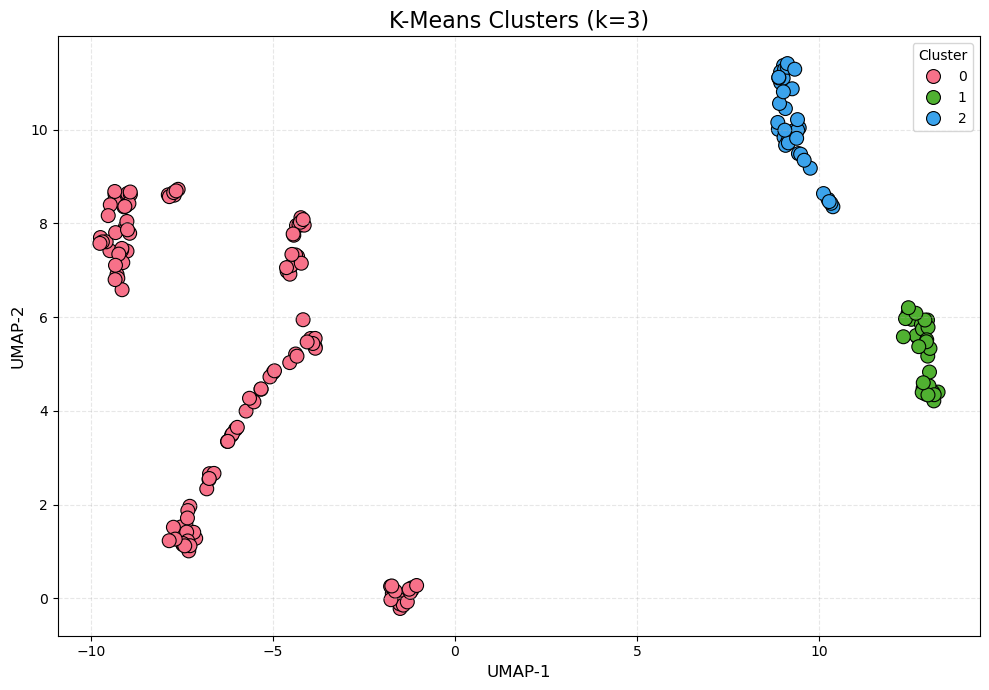

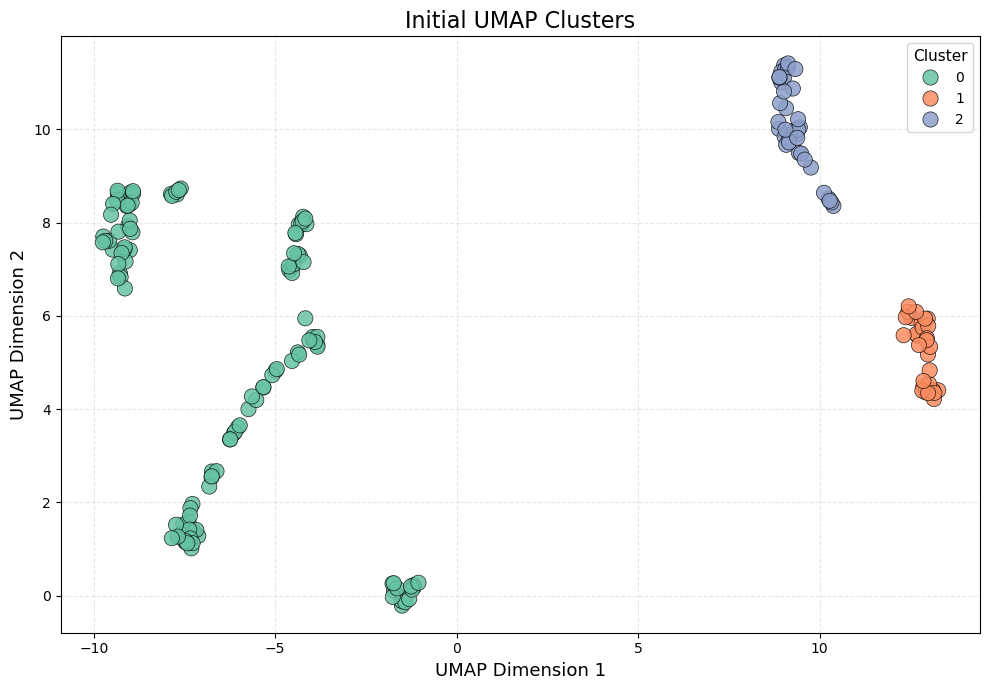

In [42]:
# Step 3: Clustering with Visualization and Silhouette Score
def plot_umap_clusters(umap_data, clusters, title="UMAP Clusters"):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np

    plt.figure(figsize=(10, 7))
    n_clusters = len(np.unique(clusters))
    palette = sns.color_palette("Set2", n_clusters)

    sns.scatterplot(
        x=umap_data[:, 0],
        y=umap_data[:, 1],
        hue=clusters,
        palette=palette,
        s=120,
        edgecolor='black',
        linewidth=0.5,
        alpha=0.85
    )
    plt.title(title, fontsize=16)
    plt.xlabel("UMAP Dimension 1", fontsize=13)
    plt.ylabel("UMAP Dimension 2", fontsize=13)
    plt.legend(title="Cluster", fontsize=10, title_fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

def perform_clustering(data, n_clusters=3, plot=True):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(data)

    silhouette = silhouette_score(data, clusters)
    print(f"K-Means clustering done. Silhouette Score: {silhouette:.3f}")

    if plot:
        plt.figure(figsize=(10, 7))
        palette = sns.color_palette("husl", n_clusters)
        sns.scatterplot(x=data[:, 0], y=data[:, 1], hue=clusters, palette=palette, s=100, edgecolor='black')
        plt.title(f"K-Means Clusters (k={n_clusters})", fontsize=16)
        plt.xlabel("UMAP-1", fontsize=12)
        plt.ylabel("UMAP-2", fontsize=12)
        plt.legend(title="Cluster")
        plt.grid(True, linestyle='--', alpha=0.3)
        plt.tight_layout()
        plt.show()

    return clusters

clusters = perform_clustering(dr_data, n_clusters=3)
plot_umap_clusters(dr_data, clusters, title="Initial UMAP Clusters")


🔍 Explaining Cluster 0...



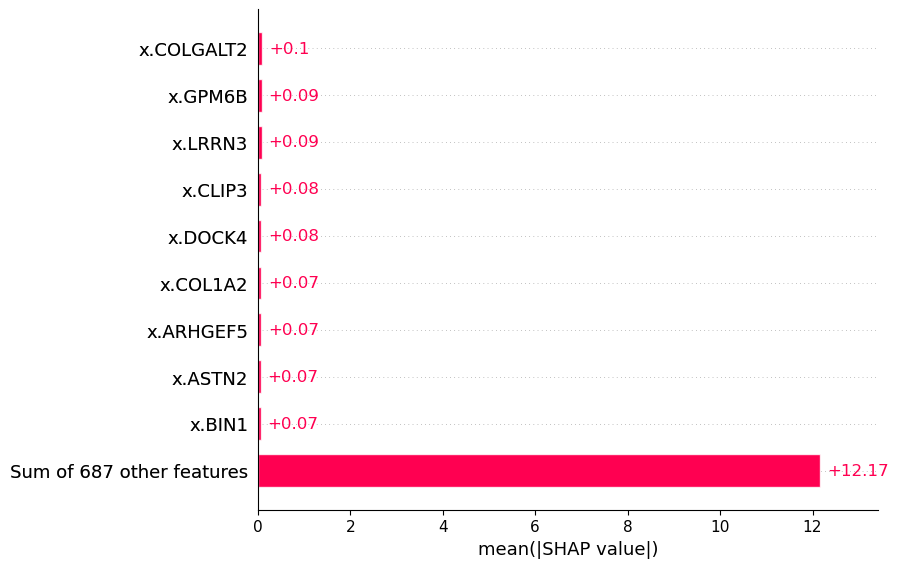

LIME Explanation for Cluster 0 Sample Index 0


C:\Users\kashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(



🔍 Explaining Cluster 1...



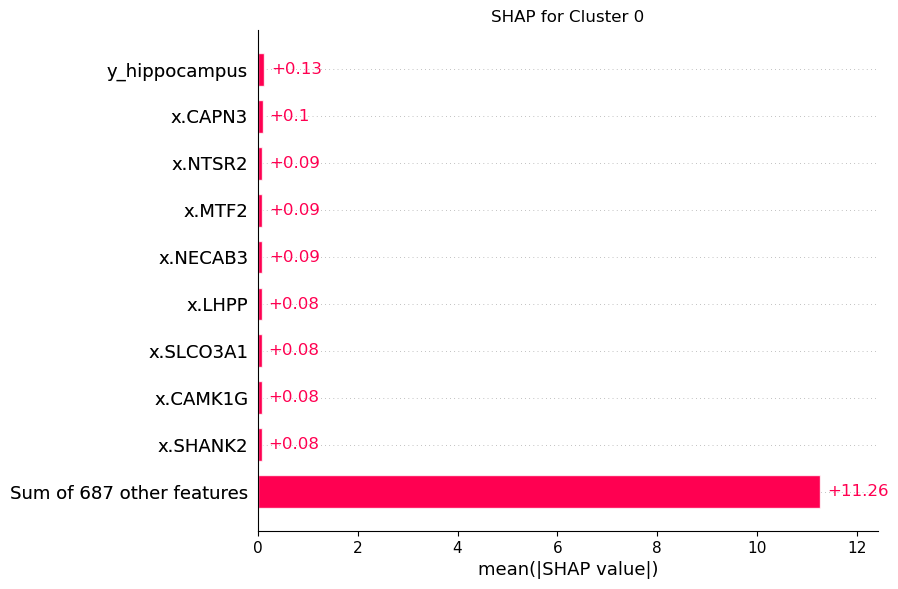

LIME Explanation for Cluster 1 Sample Index 0


C:\Users\kashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(



🔍 Explaining Cluster 2...



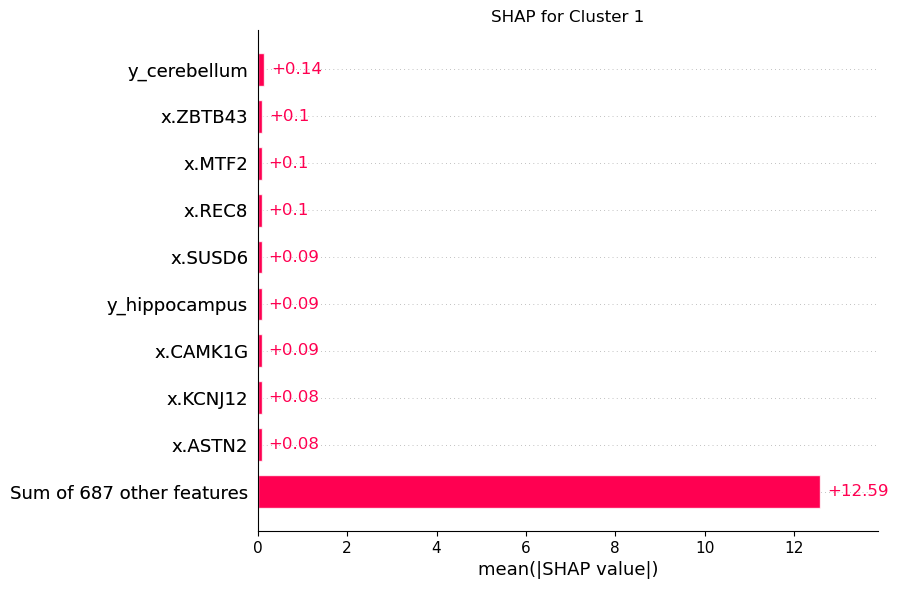

LIME Explanation for Cluster 2 Sample Index 0


C:\Users\kashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


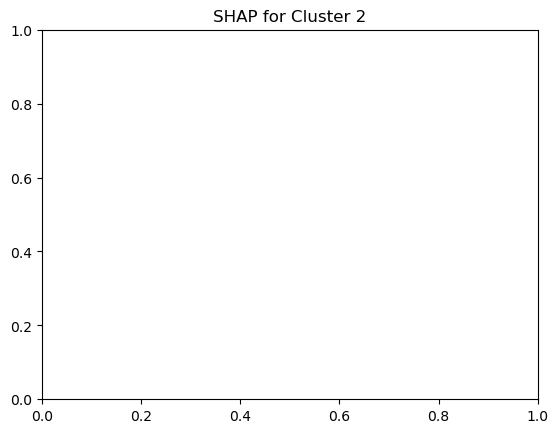

In [32]:
# Step 4: SHAP + LIME per Cluster
from lime import lime_tabular

def get_shap_lime_by_cluster(original_data, clusters, sample_index=0, show_lime=True):
    shap_summary = {}

    for cluster_id in np.unique(clusters):
        print(f"\n🔍 Explaining Cluster {cluster_id}...\n")
        
        # Create binary labels for One-vs-All SHAP
        binary_labels = (clusters == cluster_id).astype(int)

        # Fit logistic model and get SHAP values
        clf = LogisticRegression(max_iter=1000).fit(original_data, binary_labels)
        explainer = shap.Explainer(clf, original_data)
        shap_values = explainer(original_data)
        
        # SHAP bar plot
        shap.plots.bar(shap_values, max_display=10, show=True)
        plt.title(f"SHAP for Cluster {cluster_id}")  # Add title separately using matplotlib
        
        # Store top SHAP features
        mean_shap = np.abs(shap_values.values).mean(axis=0)
        shap_summary[cluster_id] = pd.Series(mean_shap, index=original_data.columns).sort_values(ascending=False)

        # LIME Explanation (Optional)
        if show_lime:
            print(f"LIME Explanation for Cluster {cluster_id} Sample Index {sample_index}")
            lime_explainer = lime_tabular.LimeTabularExplainer(
                training_data=original_data.values,
                feature_names=original_data.columns.tolist(),
                class_names=[f"Not_{cluster_id}", f"Cluster_{cluster_id}"],
                mode="classification",
                discretize_continuous=True,
                random_state=42
            )
            exp = lime_explainer.explain_instance(
                original_data.iloc[sample_index].values,
                clf.predict_proba,
                num_features=10
            )
            exp.show_in_notebook(show_table=True)

    return shap_summary

shap_summary = get_shap_lime_by_cluster(processed_data, clusters, sample_index=0)

🔎 Cluster 0: Retaining 174 features above threshold 0.03
🔎 Cluster 1: Retaining 144 features above threshold 0.03
🔎 Cluster 2: Retaining 181 features above threshold 0.03

Total features retained after refinement: 290


C:\Users\kashi\AppData\Local\Temp\ipykernel_35120\3247692491.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(shap_summary.keys()), y=cluster_counts, palette="pastel")


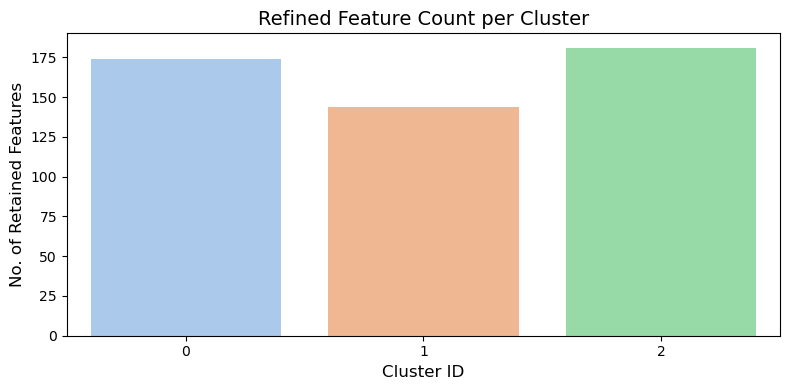

In [34]:
# Step 5: Feedback Loop – Feature Refinement using SHAP
def refine_features(original_data, shap_summary, threshold=0.01, verbose=True):
    # Collect important features from all clusters
    important_features = set()
    for cluster_id, summary in shap_summary.items():
        selected = summary[summary > threshold].index
        important_features.update(selected)
        if verbose:
            print(f"🔎 Cluster {cluster_id}: Retaining {len(selected)} features above threshold {threshold}")

    selected_features = list(important_features)
    refined_data = original_data[selected_features]

    if verbose:
        print(f"\nTotal features retained after refinement: {len(selected_features)}")
    
        # Optional: visualize feature counts per cluster
        plt.figure(figsize=(8, 4))
        cluster_counts = [sum(summary > threshold) for summary in shap_summary.values()]
        sns.barplot(x=list(shap_summary.keys()), y=cluster_counts, palette="pastel")
        plt.title("Refined Feature Count per Cluster", fontsize=14)
        plt.xlabel("Cluster ID", fontsize=12)
        plt.ylabel("No. of Retained Features", fontsize=12)
        plt.tight_layout()
        plt.show()

    return refined_data

refined_data = refine_features(processed_data, shap_summary, threshold=0.03)

C:\Users\kashi\anaconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


PCA reduced to 10 components. UMAP reduced to 2D.
K-Means clustering done. Silhouette Score: 0.509


C:\Users\kashi\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


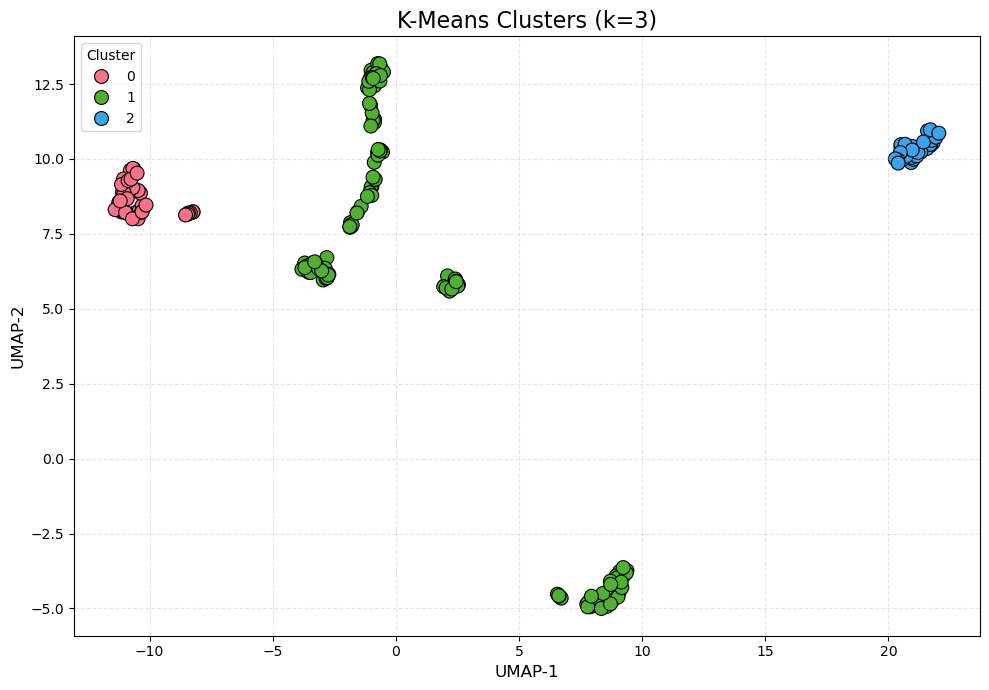

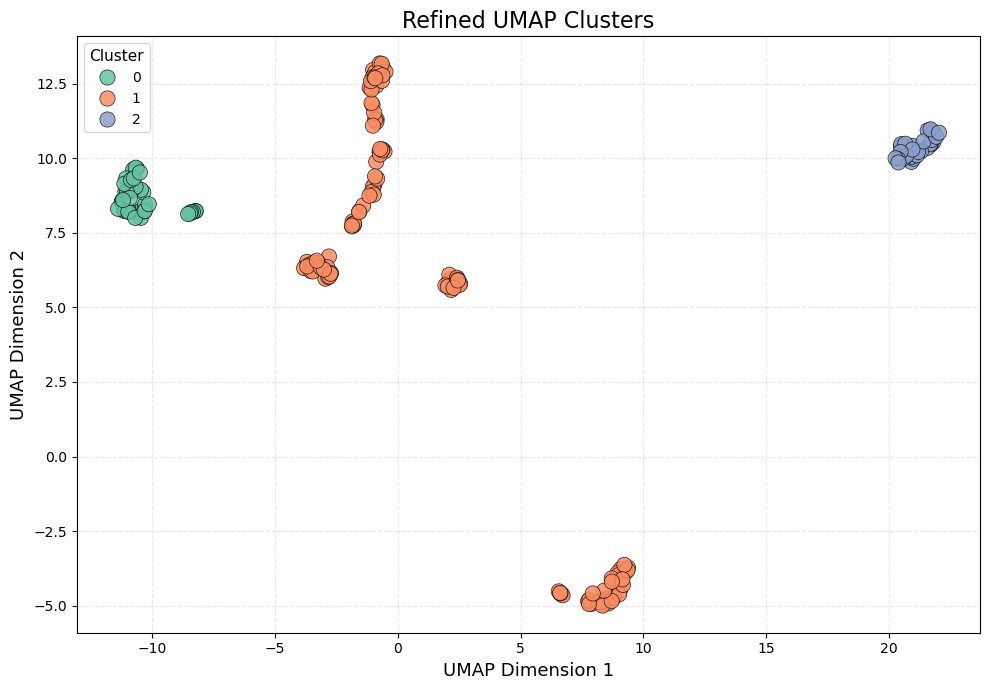


🔍 Explaining Cluster 0...



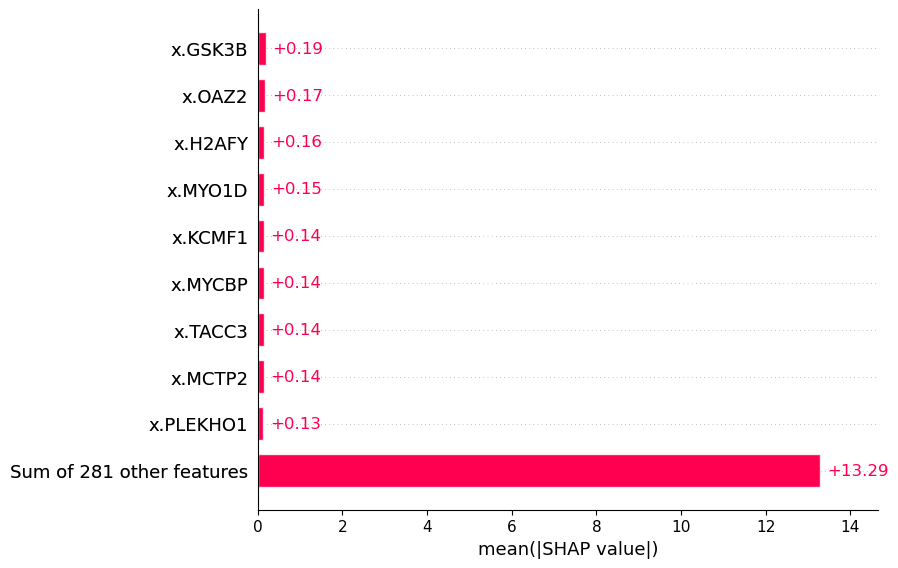

LIME Explanation for Cluster 0 Sample Index 0


C:\Users\kashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(



🔍 Explaining Cluster 1...



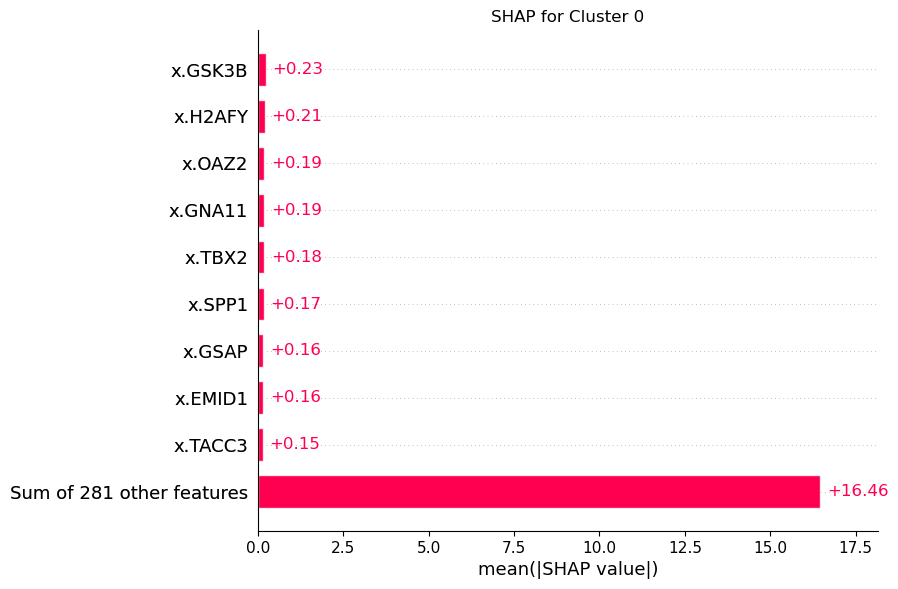

LIME Explanation for Cluster 1 Sample Index 0


C:\Users\kashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(



🔍 Explaining Cluster 2...



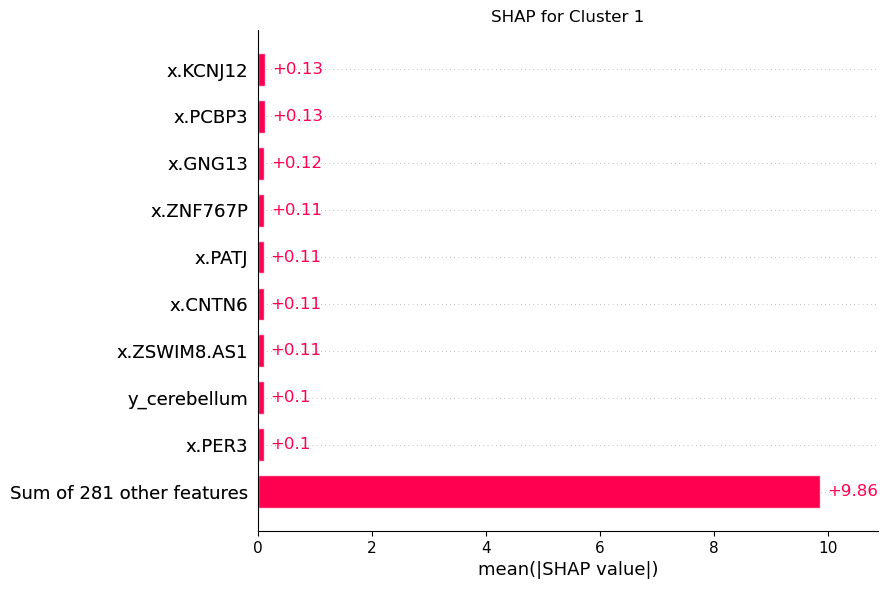

LIME Explanation for Cluster 2 Sample Index 0


C:\Users\kashi\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


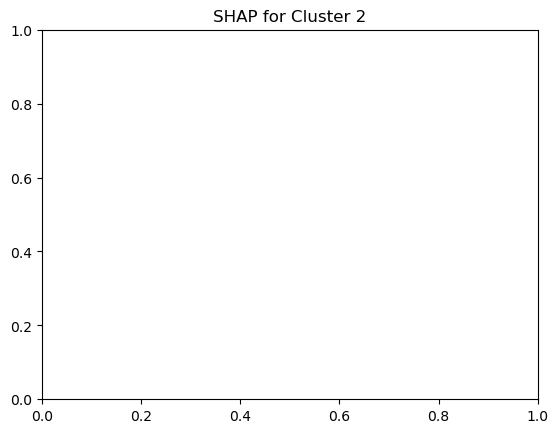

In [36]:
# Step 7: UMAP Cluster Visualization (Final Polished)
def plot_umap_clusters(umap_data, clusters, title="UMAP Clusters"):
    plt.figure(figsize=(10, 7))
    n_clusters = len(np.unique(clusters))
    palette = sns.color_palette("Set2", n_clusters)

    sns.scatterplot(
        x=umap_data[:, 0],
        y=umap_data[:, 1],
        hue=clusters,
        palette=palette,
        s=120,
        edgecolor='black',
        linewidth=0.5,
        alpha=0.85
    )
    plt.title(title, fontsize=16)
    plt.xlabel("UMAP Dimension 1", fontsize=13)
    plt.ylabel("UMAP Dimension 2", fontsize=13)
    plt.legend(title="Cluster", fontsize=10, title_fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

# Step 6: Re-run DR + Clustering on Refined Data
refined_dr_data, refined_pca = apply_dimensionality_reduction(refined_data, return_pca=True)
refined_clusters = perform_clustering(refined_dr_data, n_clusters=3)
plot_umap_clusters(refined_dr_data, refined_clusters, title="Refined UMAP Clusters")

# Step 7: Explainability again (Refined SHAP + LIME)
refined_shap_summary = get_shap_lime_by_cluster(refined_data, refined_clusters, sample_index=0)

In [38]:
# Step 6: Calculate CECS – Cluster Explanation Consistency Score
def calculate_cecs(shap_summary, top_n=10, show_plot=True):
    clusters = list(shap_summary.keys())
    score_list = []
    pair_labels = []

    for i in range(len(clusters)):
        for j in range(i + 1, len(clusters)):
            set_i = set(shap_summary[clusters[i]].head(top_n).index)
            set_j = set(shap_summary[clusters[j]].head(top_n).index)
            jaccard = len(set_i & set_j) / len(set_i | set_j)
            score_list.append(jaccard)
            pair_labels.append(f"{clusters[i]} vs {clusters[j]}")

    avg_cecs = np.mean(score_list)
    print(f"CECS Score (Top {top_n} SHAP features): {avg_cecs:.3f}")

    if show_plot:
        plt.figure(figsize=(8, 4))
        sns.barplot(x=pair_labels, y=score_list, palette="muted")
        plt.title("Pairwise Jaccard Similarities (Top SHAP Features)", fontsize=14)
        plt.ylabel("Jaccard Score", fontsize=12)
        plt.xlabel("Cluster Pair", fontsize=12)
        plt.ylim(0, 1)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    return avg_cecs

CECS Score (Top 10 SHAP features): 0.129
CECS Score (Top 10 SHAP features): 0.111


C:\Users\kashi\AppData\Local\Temp\ipykernel_35120\2407041732.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=pair_labels, y=score_list, palette="muted")


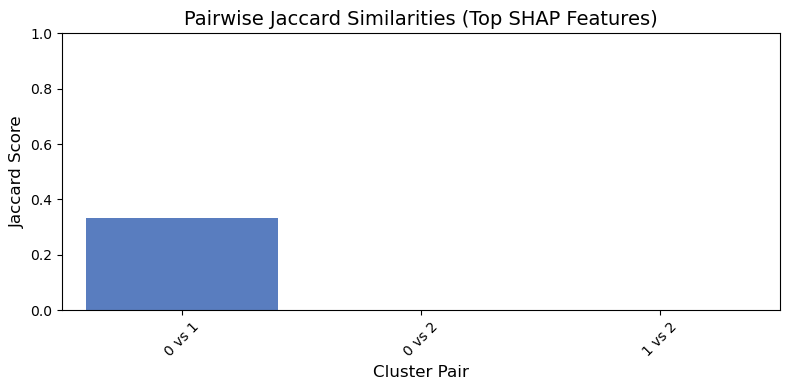


Initial CECS Score: 0.129
Refined CECS Score: 0.111


In [40]:
# Main CECS Scores

initial_cecs = calculate_cecs(shap_summary, show_plot=False)
refined_cecs = calculate_cecs(refined_shap_summary, show_plot=True)

print(f"\nInitial CECS Score: {initial_cecs:.3f}")
print(f"Refined CECS Score: {refined_cecs:.3f}")